In [1]:
!pip install transformers datasets torch torchvision scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 487.4/487.4 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 57.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

Libraries

In [2]:
import torch
from transformers import ViTForImageClassification, AutoImageProcessor, Trainer, TrainingArguments
from datasets import load_dataset, DatasetDict
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import numpy as np
import random
import matplotlib.pyplot as plt
from PIL import Image

Question 1 Spoof Detection

In [3]:
# Set seeds for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
print("Loading dataset...")
# Step 1: Load a small subset of the dataset for quick training
ds = load_dataset("nguyenkhoa/celeba-spoof-for-face-antispoofing-test", split="test")
print(ds)

Loading dataset...


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/437 [00:00<?, ?B/s]

test-00000-of-00010.parquet:   0%|          | 0.00/496M [00:00<?, ?B/s]

test-00001-of-00010.parquet:   0%|          | 0.00/493M [00:00<?, ?B/s]

test-00002-of-00010.parquet:   0%|          | 0.00/494M [00:00<?, ?B/s]

test-00003-of-00010.parquet:   0%|          | 0.00/487M [00:00<?, ?B/s]

test-00004-of-00010.parquet:   0%|          | 0.00/495M [00:00<?, ?B/s]

test-00005-of-00010.parquet:   0%|          | 0.00/499M [00:00<?, ?B/s]

test-00006-of-00010.parquet:   0%|          | 0.00/500M [00:00<?, ?B/s]

test-00007-of-00010.parquet:   0%|          | 0.00/498M [00:00<?, ?B/s]

test-00008-of-00010.parquet:   0%|          | 0.00/487M [00:00<?, ?B/s]

test-00009-of-00010.parquet:   0%|          | 0.00/495M [00:00<?, ?B/s]

Generating test split:   0%|          | 0/67170 [00:00<?, ? examples/s]

Dataset({
    features: ['cropped_image', 'labels', 'labelNames'],
    num_rows: 67170
})


20% dataset size of 67170 = 13434 rows

In [4]:
size = 13434
ds = ds.shuffle(seed=seed).select(range(size))

In [5]:
train_test_split = ds.train_test_split(test_size=0.3, seed=seed)
train_dataset = train_test_split['train']
temp = train_test_split['test'].train_test_split(test_size=0.5, seed=seed)
val_dataset = temp['train']
test_dataset = temp['test']

# Create DatasetDict
dataset = DatasetDict({
    'train': train_dataset,
    'validation': val_dataset,
    'test': test_dataset
})

print(f"Dataset split sizes: Train={len(dataset['train'])}, Validation={len(dataset['validation'])}, Test={len(dataset['test'])}")

# Step 4: Filter out any potentially invalid images
for split in dataset:
    dataset[split] = dataset[split].filter(lambda example: example['cropped_image'] is not None)
    print(f"After filtering: {split}={len(dataset[split])}")

Dataset split sizes: Train=9403, Validation=2015, Test=2016


Filter:   0%|          | 0/9403 [00:00<?, ? examples/s]

After filtering: train=9337


Filter:   0%|          | 0/2015 [00:00<?, ? examples/s]

After filtering: validation=2004


Filter:   0%|          | 0/2016 [00:00<?, ? examples/s]

After filtering: test=2007


In [6]:
print("Loading ViT image processor...")
processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224")


Loading ViT image processor...


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


In [7]:
def preprocess_function(examples):
    images = [img.convert("RGB") for img in examples['cropped_image']]
    inputs = processor(images, return_tensors="pt")
    return {
        'pixel_values': inputs.pixel_values,
        'labels': examples['labels']
    }


In [8]:

print("Starting the preprocessing the dataset")
processed_dataset = {}
for split in dataset:
    processed_dataset[split] = dataset[split].map(
        preprocess_function,
        batched=True,
        batch_size=16,
        remove_columns=['cropped_image', 'labelNames']
    )
    processed_dataset[split].set_format(type='torch', columns=['pixel_values', 'labels'])

print("Processing finished")


Starting the preprocessing the dataset


Map:   0%|          | 0/9337 [00:00<?, ? examples/s]

Map:   0%|          | 0/2004 [00:00<?, ? examples/s]

Map:   0%|          | 0/2007 [00:00<?, ? examples/s]

Processing finished


In [9]:
# Step 8: Define evaluation metrics function
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='binary')
    acc = accuracy_score(labels, preds)
    return {
        'accuracy': acc,
        'precision': precision,
        'recall': recall,
        'f1': f1,
    }

# Step 9: Load the ViT model and configure for binary classification
print("Loading ViT model...")
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224",
    num_labels=2,
    ignore_mismatched_sizes=True
)

Loading ViT model...


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([2]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([2, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [10]:


# Step 10: Configure training arguments for fast training
training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=3,              # Just 3 epochs for quick training
    per_device_train_batch_size=16,  # Adjust based on your GPU memory
    per_device_eval_batch_size=16,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    learning_rate=5e-5,
    weight_decay=0.01,
    logging_dir='./logs',
    load_best_model_at_end=True,
    report_to="none",               # Disable wandb/tensorboard reporting
    logging_steps=10,               # Less frequent logging
    save_total_limit=1,             # Only keep the best model
)
# Step 11: Initialize trainer
print("Initializing trainer...")

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=processed_dataset['train'],
    eval_dataset=processed_dataset['validation'],
    compute_metrics=compute_metrics,
)

/usr/local/lib/python3.11/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Initializing trainer...


In [11]:
# Step 12: Train the model
print("Train the model")
trainer.train()

Train the model


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.001700,0.003324,0.999002,0.999291,0.999291,0.999291
2,0.000100,0.003589,0.998004,0.997875,0.999291,0.998583
3,0.000000,0.006767,0.998004,0.997171,1.000000,0.998584


TrainOutput(global_step=1752, training_loss=0.02534896689688297, metrics={'train_runtime': 1514.3146, 'train_samples_per_second': 18.497, 'train_steps_per_second': 1.157, 'total_flos': 2.1706281210943365e+18, 'train_loss': 0.02534896689688297, 'epoch': 3.0})

In [12]:
# Step 13: Evaluate on test set
print("Evaluating on test set...")
test_results = trainer.evaluate(processed_dataset['test'])
print("\nTest Set Evaluation Metrics:")
for key, value in test_results.items():
    print(f"{key}: {value:.4f}")

Evaluating on test set...



Test Set Evaluation Metrics:
eval_loss: 0.0048
eval_accuracy: 0.9970
eval_precision: 0.9986
eval_recall: 0.9972
eval_f1: 0.9979
eval_runtime: 46.3592
eval_samples_per_second: 43.2920
eval_steps_per_second: 2.7180
epoch: 3.0000


Testing

Visualizing predictions on test samples...


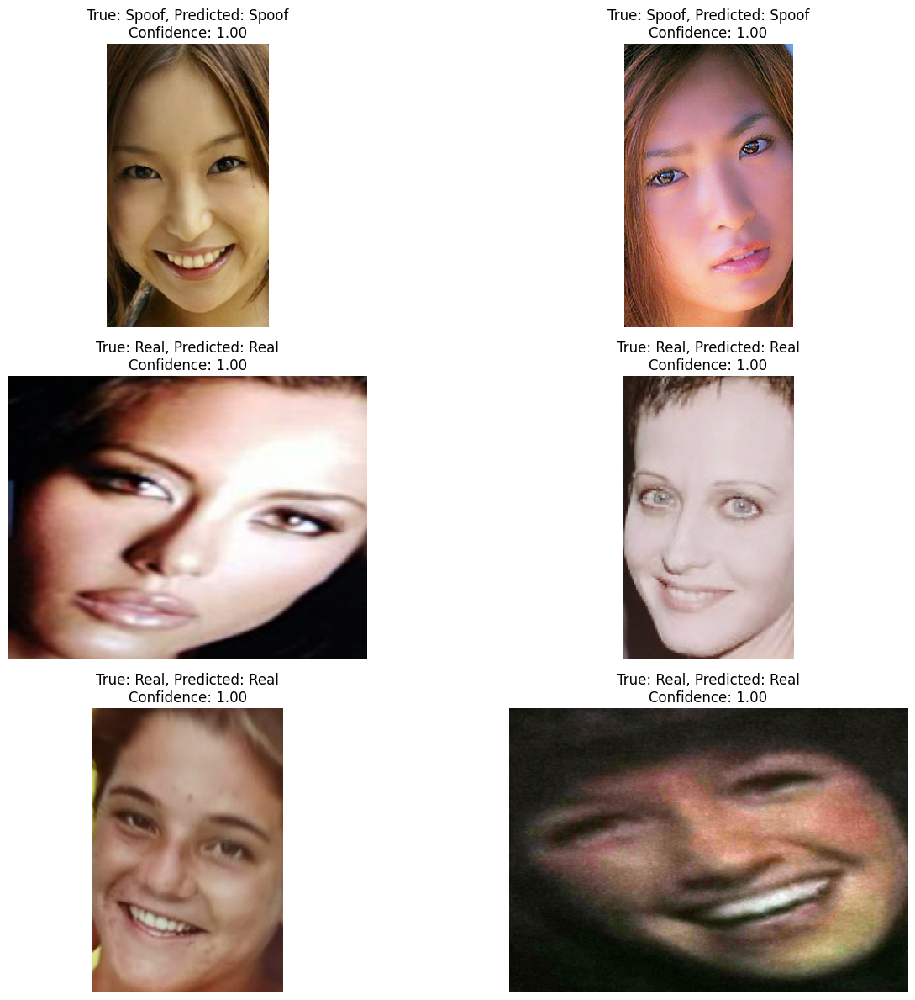

In [13]:
# Step 14: Test with some examples from the test set
def get_prediction(image, model, processor):
    # Convert image to RGB if not already
    if not isinstance(image, Image.Image):
        image = Image.fromarray(image)
    if image.mode != 'RGB':
        image = image.convert('RGB')

    # Process the image
    inputs = processor(images=image, return_tensors="pt")

    # Move to the same device as model
    pixel_values = inputs['pixel_values'].to(model.device)

    # Get predictions
    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)

    # Get prediction and confidence
    logits = outputs.logits
    probabilities = torch.nn.functional.softmax(logits, dim=1)
    pred_class = torch.argmax(logits, dim=1).item()
    confidence = probabilities[0][pred_class].item()

    # Return class (0 for spoof, 1 for real) and confidence
    label = "Real" if pred_class == 1 else "Spoof"
    return label, confidence

# Select 6 random samples from the test set to visualize predictions
print("Visualizing predictions on test samples...")
test_examples = dataset['test'].shuffle(seed=42).select(range(6))

plt.figure(figsize=(15, 12))
for i, example in enumerate(test_examples):
    image = example['cropped_image']
    true_label = "Real" if example['labels'] == 1 else "Spoof"

    # Get model prediction
    pred_label, confidence = get_prediction(image, model, processor)

    # Plot the image with labels
    plt.subplot(3, 2, i+1)
    plt.imshow(image)
    plt.title(f"True: {true_label}, Predicted: {pred_label}\nConfidence: {confidence:.2f}", fontsize=12)
    plt.axis('off')

    # Add red/green border based on correct/incorrect prediction
    if true_label == pred_label:
        plt.gca().spines['top'].set_color('green')
        plt.gca().spines['bottom'].set_color('green')
        plt.gca().spines['left'].set_color('green')
        plt.gca().spines['right'].set_color('green')
        plt.gca().spines['top'].set_linewidth(5)
        plt.gca().spines['bottom'].set_linewidth(5)
        plt.gca().spines['left'].set_linewidth(5)
        plt.gca().spines['right'].set_linewidth(5)
    else:
        plt.gca().spines['top'].set_color('red')
        plt.gca().spines['bottom'].set_color('red')
        plt.gca().spines['left'].set_color('red')
        plt.gca().spines['right'].set_color('red')
        plt.gca().spines['top'].set_linewidth(5)
        plt.gca().spines['bottom'].set_linewidth(5)
        plt.gca().spines['left'].set_linewidth(5)
        plt.gca().spines['right'].set_linewidth(5)

plt.tight_layout()
plt.savefig('spoof_detection_results.png')
plt.show()


Own Picture testing

In [14]:
print("\n--- Testing with Your Own Photos (Real vs Spoofed) ---")

# Function to load and process your own images
def test_your_own_image(image_path, model, processor, true_label):
    """
    Test the model on your own images (real or spoofed)

    Args:
        image_path: Path to your image file
        model: Trained ViT model
        processor: Image processor
        true_label: The ground truth label ("Real" or "Spoof")
    """
    try:
        # Load and display the image
        image = Image.open(image_path).convert("RGB")

        # Resize if needed
        if image.size != (224, 224):
            image = image.resize((224, 224))

        # Get prediction
        pred_label, confidence = get_prediction(image, model, processor)

        # Display the image with prediction
        plt.figure(figsize=(6, 6))
        plt.imshow(image)
        plt.title(f"True: {true_label}, Predicted: {pred_label}\nConfidence: {confidence:.2f}", fontsize=12)
        plt.axis('off')

        # Add red/green border based on correct/incorrect prediction
        if true_label == pred_label:
            plt.gca().spines['top'].set_color('green')
            plt.gca().spines['bottom'].set_color('green')
            plt.gca().spines['left'].set_color('green')
            plt.gca().spines['right'].set_color('green')
            plt.gca().spines['top'].set_linewidth(5)
            plt.gca().spines['bottom'].set_linewidth(5)
            plt.gca().spines['left'].set_linewidth(5)
            plt.gca().spines['right'].set_linewidth(5)
        else:
            plt.gca().spines['top'].set_color('red')
            plt.gca().spines['bottom'].set_color('red')
            plt.gca().spines['left'].set_color('red')
            plt.gca().spines['right'].set_color('red')
            plt.gca().spines['top'].set_linewidth(5)
            plt.gca().spines['bottom'].set_linewidth(5)
            plt.gca().spines['left'].set_linewidth(5)
            plt.gca().spines['right'].set_linewidth(5)

        plt.tight_layout()
        plt.savefig(f"{true_label.lower()}_photo_test.png")
        plt.show()

        return pred_label, confidence

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None, None




--- Testing with Your Own Photos (Real vs Spoofed) ---



Testing with real photo:


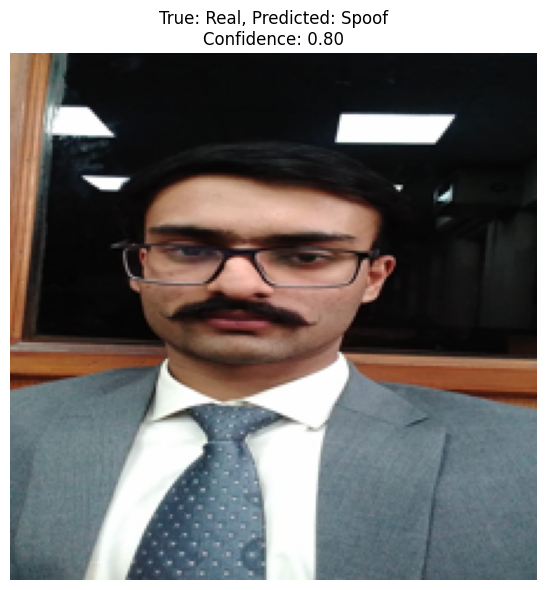


Testing with spoofed photo:


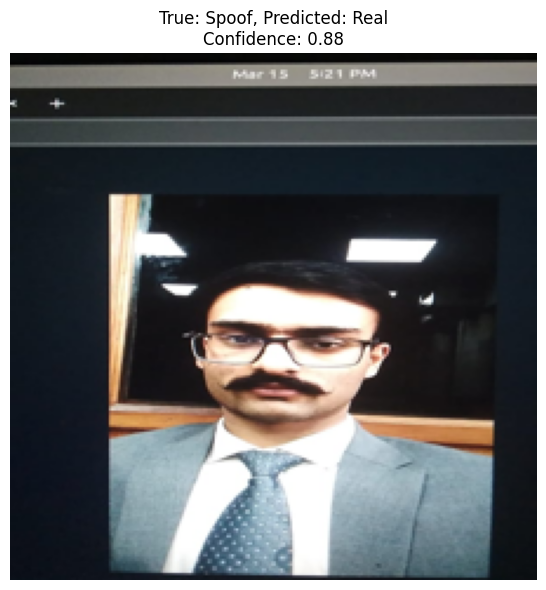

In [15]:

your_real_photo_path = "/content/real.jpeg"
your_spoof_photo_path = "/content/spoof.jpeg"

print("\nTesting with real photo:")

real_pred, real_conf = test_your_own_image(your_real_photo_path, model, processor, "Real")

print("\nTesting with spoofed photo:")
# Uncomment the following line and replace with your spoofed photo path
spoof_pred, spoof_conf = test_your_own_image(your_spoof_photo_path, model, processor, "Spoof")


## Part 2: AI-Powered Visual Search (35%)

Libraries:

In [16]:
import os
import torch
import requests
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.auto import tqdm
import json
import random
from transformers import CLIPProcessor, CLIPModel
from pycocotools.coco import COCO
import zipfile
import io

Initializing:

In [17]:
# Set random seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


Using device: cuda


Dataset processing

In [18]:
# Create directories to store dataset
os.makedirs("coco_data", exist_ok=True)
os.makedirs("coco_data/val2017", exist_ok=True)
os.makedirs("coco_data/annotations", exist_ok=True)

def download_file(url, save_path):
    """Download a file if it doesn't exist already"""
    if os.path.exists(save_path):
        print(f"File already exists: {save_path}")
        return save_path

    print(f"Downloading {url} to {save_path}...")
    response = requests.get(url, stream=True)
    response.raise_for_status()

    # Get the total file size
    file_size = int(response.headers.get('content-length', 0))

    # Progress bar for downloading
    progress = tqdm(total=file_size, unit='B', unit_scale=True)

    # Write the file
    with open(save_path, 'wb') as f:
        for chunk in response.iter_content(chunk_size=8192):
            if chunk:
                f.write(chunk)
                progress.update(len(chunk))

    progress.close()
    return save_path

In [19]:
# Download a small subset of COCO val2017 images (instead of the entire dataset)
def download_small_coco_subset():
    """Download a small subset of COCO val2017 for faster processing"""

    # Download annotations first - we need this to select a subset of images
    annotations_url = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
    annotations_zip = "coco_data/annotations_trainval2017.zip"
    download_file(annotations_url, annotations_zip)

    # Extract the annotations
    if not os.path.exists("coco_data/annotations/instances_val2017.json"):
        print("Extracting annotations...")
        with zipfile.ZipFile(annotations_zip, 'r') as zip_ref:
            # Extract only the validation annotations
            for file in zip_ref.namelist():
                if file.startswith('annotations/instances_val2017.json') or file.startswith('annotations/captions_val2017.json'):
                    zip_ref.extract(file, "coco_data")

    # Load the annotations
    coco_captions = COCO("coco_data/annotations/captions_val2017.json")

    # Get all image IDs
    all_img_ids = list(coco_captions.imgs.keys())

    num_images = max(1, int(0.2 * len(all_img_ids)))
    selected_img_ids = random.sample(all_img_ids, num_images)

    # Create a direct download link for each selected image
    image_urls = []
    image_ids = []

    for img_id in selected_img_ids:
        img_info = coco_captions.loadImgs(img_id)[0]
        file_name = img_info['file_name']
        img_url = f"http://images.cocodataset.org/val2017/{file_name}"
        image_urls.append(img_url)
        image_ids.append(img_id)

    # Download the selected images
    for i, (img_url, img_id) in enumerate(zip(image_urls, image_ids)):
        img_info = coco_captions.loadImgs(img_id)[0]
        file_name = img_info['file_name']
        save_path = os.path.join("coco_data/val2017", file_name)

        if not os.path.exists(save_path):
            try:
                # Print progress every 10 images
                if i % 10 == 0:
                    print(f"Downloading image {i+1}/{len(image_urls)}...")

                response = requests.get(img_url)
                response.raise_for_status()

                with open(save_path, 'wb') as f:
                    f.write(response.content)
            except Exception as e:
                print(f"Error downloading {img_url}: {e}")

    # Save the selected image IDs for later use
    with open("coco_data/selected_image_ids.json", 'w') as f:
        json.dump(selected_img_ids, f)

    return selected_img_ids

In [20]:
# Download a small subset of COCO
print("Downloading a small subset of COCO val2017 dataset...")
selected_img_ids = download_small_coco_subset()
print(f"Downloaded {len(selected_img_ids)} images from COCO val2017 dataset.")


  0%|          | 0.00/253M [00:00<?, ?B/s]

Extracting annotations...
loading annotations into memory...
Done (t=0.08s)
creating index...
index created!
Downloaded 1000 images from COCO val2017 dataset.


Loading the clip modal:

In [21]:
# Load CLIP model and processor
print("Loading CLIP model...")
model_name = "openai/clip-vit-base-patch32"
model = CLIPModel.from_pretrained(model_name).to(device)
processor = CLIPProcessor.from_pretrained(model_name)
print(model)

# Load COCO annotations
print("Loading COCO annotations...")
coco_captions = COCO("coco_data/annotations/captions_val2017.json")

Loading CLIP model...


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPSdpaAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e

In [22]:
# Function to load image from file
def load_image(image_path):
    """Load an image from file path"""
    try:
        image = Image.open(image_path).convert("RGB")
        return image
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None


# Function to encode text query
def encode_text(text_queries):
    """Encode text queries using CLIP model"""
    with torch.no_grad():
        inputs = processor(text=text_queries, return_tensors="pt", padding=True).to(device)
        text_features = model.get_text_features(**inputs)
        # Normalize features
        text_features = text_features / text_features.norm(dim=1, keepdim=True)
    return text_features.cpu()

# Function to compute and cache image features
def compute_image_features(images, batch_size=16):
    """Compute image features using CLIP model"""
    features_list = []

    # Process images in batches
    for i in range(0, len(images), batch_size):
        print(f"Processing batch {i//batch_size + 1}/{len(images)//batch_size + 1}...")
        batch_images = images[i:i+batch_size]

        with torch.no_grad():
            inputs = processor(images=batch_images, return_tensors="pt", padding=True).to(device)
            features = model.get_image_features(**inputs)
            # Normalize features
            features = features / features.norm(dim=1, keepdim=True)
            features_list.append(features.cpu())

    # Concatenate all features
    all_features = torch.cat(features_list, dim=0)
    return all_features

# Create a list of image paths and load images
print("Loading images...")
image_paths = []
images = []
valid_img_ids = []

for img_id in selected_img_ids:
    img_info = coco_captions.loadImgs(img_id)[0]
    file_name = img_info['file_name']
    img_path = os.path.join("coco_data/val2017", file_name)

    if os.path.exists(img_path):
        image = load_image(img_path)
        if image is not None:
            image_paths.append(img_path)
            images.append(image)
            valid_img_ids.append(img_id)

print(f"Successfully loaded {len(images)} images.")


# Compute image features
print("Computing image features...")
image_features = compute_image_features(images)
print(f"Image features shape: {image_features.shape}")



Loading images...
Successfully loaded 1000 images.
Computing image features...
Processing batch 1/63...
Processing batch 2/63...
Processing batch 3/63...
Processing batch 4/63...
Processing batch 5/63...
Processing batch 6/63...
Processing batch 7/63...
Processing batch 8/63...
Processing batch 9/63...
Processing batch 10/63...
Processing batch 11/63...
Processing batch 12/63...
Processing batch 13/63...
Processing batch 14/63...
Processing batch 15/63...
Processing batch 16/63...
Processing batch 17/63...
Processing batch 18/63...
Processing batch 19/63...
Processing batch 20/63...
Processing batch 21/63...
Processing batch 22/63...
Processing batch 23/63...
Processing batch 24/63...
Processing batch 25/63...
Processing batch 26/63...
Processing batch 27/63...
Processing batch 28/63...
Processing batch 29/63...
Processing batch 30/63...
Processing batch 31/63...
Processing batch 32/63...
Processing batch 33/63...
Processing batch 34/63...
Processing batch 35/63...
Processing batch 36/

In [23]:
# Function to retrieve and display images based on text query
def retrieve_images_by_text(text_query, top_k=5):
    """Retrieve and display the top_k images most similar to the text query"""
    # Encode the text query
    text_features = encode_text([text_query])

    # Calculate similarity between text and all images
    similarity = (100.0 * text_features @ image_features.T).squeeze(0)

    # Get the top_k highest similarity scores and their indices
    values, indices = similarity.topk(top_k)

    # Display the results
    plt.figure(figsize=(15, 10))
    plt.suptitle(f'Top {top_k} images for query: "{text_query}"', fontsize=16)

    for i, (idx, score) in enumerate(zip(indices, values)):
        # Get the image
        image = images[idx]

        # Display the image and its similarity score
        plt.subplot(1, top_k, i+1)
        plt.imshow(image)
        plt.title(f"Sim: {score:.4f}", fontsize=12)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(f'clip_retrieval_{text_query.replace(" ", "_")}.png')
    plt.show()

    return indices, values


Testing image retrieval system...

Retrieving images for query: 'A person riding a horse'


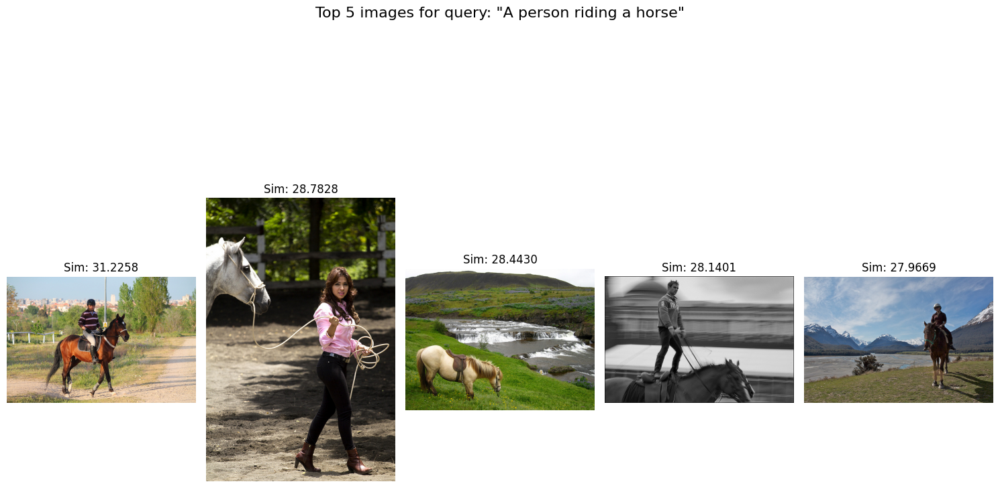

Similarity scores:
 -> Image id: 1 Score:  31.2258
 -> Image id: 2 Score:  28.7828
 -> Image id: 3 Score:  28.4430
 -> Image id: 4 Score:  28.1401
 -> Image id: 5 Score:  27.9669

Retrieving images for query: 'watercolor painting.'


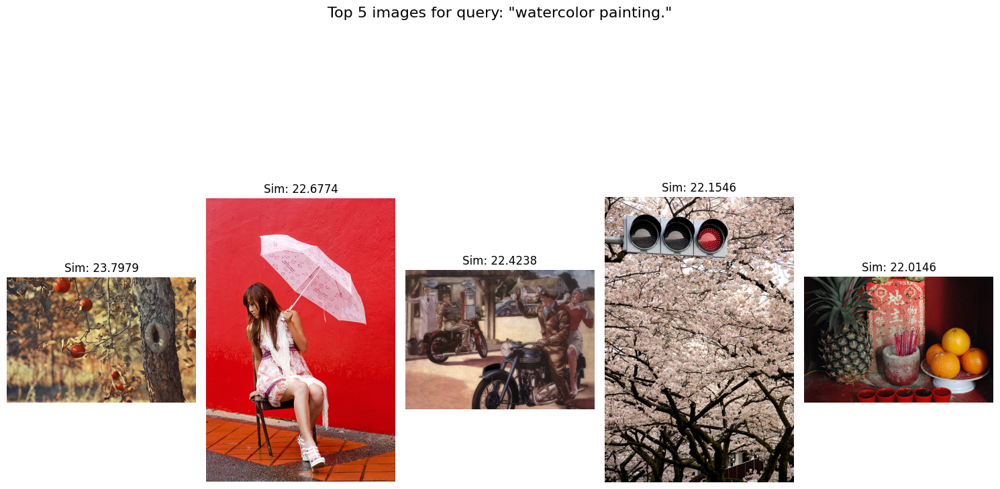

Similarity scores:
 -> Image id: 1 Score:  23.7979
 -> Image id: 2 Score:  22.6774
 -> Image id: 3 Score:  22.4238
 -> Image id: 4 Score:  22.1546
 -> Image id: 5 Score:  22.0146

Retrieving images for query: 'a pixel art'


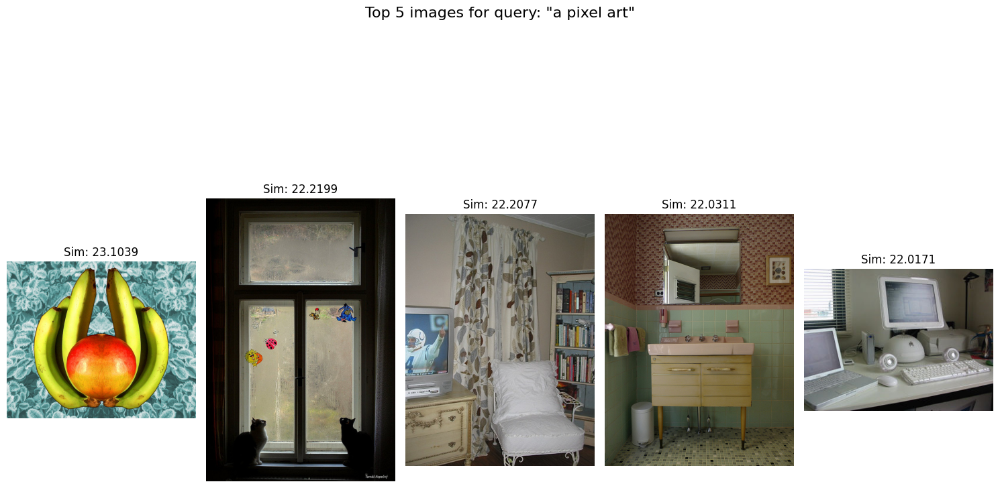

Similarity scores:
 -> Image id: 1 Score:  23.1039
 -> Image id: 2 Score:  22.2199
 -> Image id: 3 Score:  22.2077
 -> Image id: 4 Score:  22.0311
 -> Image id: 5 Score:  22.0171

Retrieving images for query: 'in the style of Salvador Dalí'


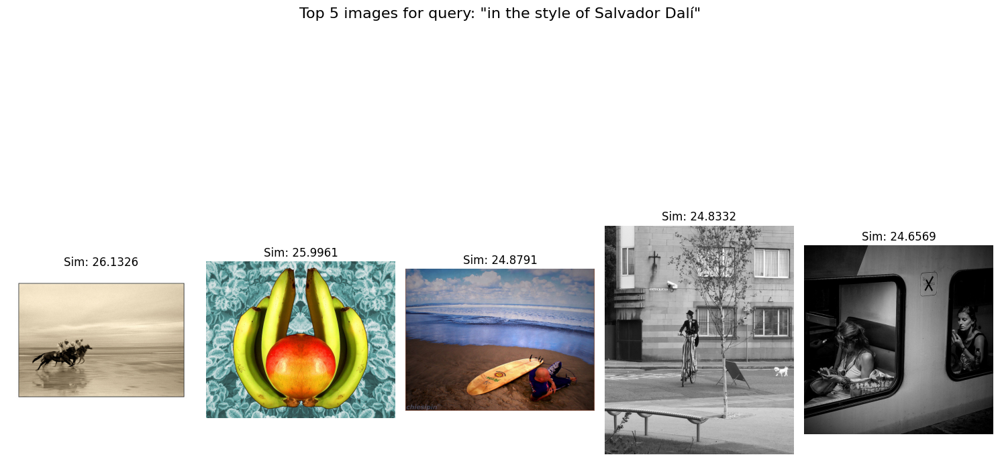

Similarity scores:
 -> Image id: 1 Score:  26.1326
 -> Image id: 2 Score:  25.9961
 -> Image id: 3 Score:  24.8791
 -> Image id: 4 Score:  24.8332
 -> Image id: 5 Score:  24.6569

Retrieving images for query: 'in the style of Van goh'


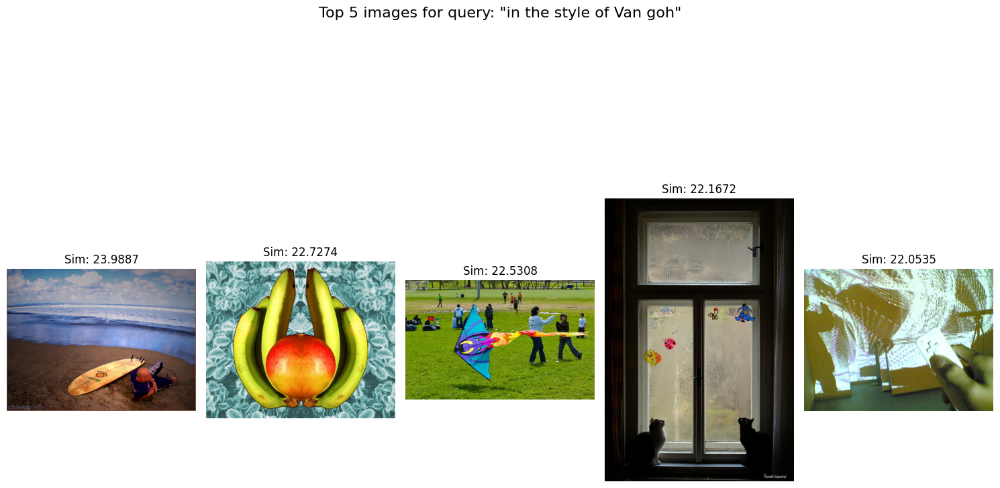

Similarity scores:
 -> Image id: 1 Score:  23.9887
 -> Image id: 2 Score:  22.7274
 -> Image id: 3 Score:  22.5308
 -> Image id: 4 Score:  22.1672
 -> Image id: 5 Score:  22.0535


In [24]:
# Test the retrieval system with example queries
print("\nTesting image retrieval system...")

# List of example queries to try
example_queries = [
    "A person riding a horse",
    "watercolor painting.",
    "a pixel art",
    "in the style of Salvador Dalí",
    "in the style of Van goh"
]

# Try each query and display results
for query in example_queries:
    print(f"\nRetrieving images for query: '{query}'")
    indices, scores = retrieve_images_by_text(query)

    # Print the similarity scores
    print("Similarity scores:")
    for i, score in enumerate(scores):
        print(f" -> Image id: {i+1} Score:  {score:.4f}")

## Part 3: Stable Diffusion Implementation

Liberaries

In [25]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.auto import tqdm
from diffusers import StableDiffusionImg2ImgPipeline, DPMSolverMultistepScheduler
import warnings

Initialize

In [26]:
# Suppress unnecessary warnings
warnings.filterwarnings("ignore")

# Create output directory
os.makedirs("stable_diffusion_outputs", exist_ok=True)

# Set random seed for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)

# Check for GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


Code:

In [27]:
# Function to load the Stable Diffusion model
def load_stable_diffusion_model():
    """Load the Stable Diffusion model with optimized settings"""
    print("Loading Stable Diffusion model...")

    # Load the img2img pipeline with a smaller model for faster processing
    model_id = "CompVis/stable-diffusion-v1-4"  # Smaller than v2-1

    # Use the DPMSolver scheduler for faster inference
    pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
        model_id,
        torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
        safety_checker=None,  # Disable safety checker for speed
    )

    # Set the scheduler to DPMSolver for faster inference
    pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

    # Move to GPU if available
    pipe = pipe.to(device)

    # Enable memory efficient attention if using GPU
    if torch.cuda.is_available():
        pipe.enable_attention_slicing()

    return pipe


Dataset

In [28]:
# Function to load a sample input image
def load_sample_image(image_path=None):
    """Load a sample image or use a generated noise image"""
    if image_path and os.path.exists(image_path):
        # Load the user-provided image
        image = Image.open(image_path).convert("RGB")

        # Resize the image to a reasonable size for faster processing
        image = image.resize((512, 512))
        return image
    else:
        # If no image is provided, create a simple colored noise image
        print("No input image provided, generating a noise image...")

        # Create a random noise image with a base color for more interesting results
        width, height = 512, 512
        noise = np.random.rand(height, width, 3) * 0.2

        # Add a base color (light blue)
        base_color = np.array([0.7, 0.8, 0.9])
        image_array = base_color + noise

        # Clip values to [0, 1] range and convert to uint8
        image_array = np.clip(image_array, 0, 1)
        image_array = (image_array * 255).astype(np.uint8)

        # Convert to PIL image
        image = Image.fromarray(image_array)

        # Save the noise image
        image.save("stable_diffusion_outputs/noise_input.png")
        print("Noise input image saved to 'stable_diffusion_outputs/noise_input.png'")

        return image

In [33]:
# Function to generate variations using Stable Diffusion
def generate_image_variation(pipe, input_image, prompt, strength=0.75, guidance_scale=7.5, num_inference_steps=50, seed=None):
    """Generate image variations using Stable Diffusion"""
    # Set the seed if provided
    generator = None
    if seed is not None:
        generator = torch.Generator(device=device).manual_seed(seed)

    # Generate the image
    image = pipe(
        prompt=prompt,
        image=input_image,
        strength=strength,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=generator,
    ).images[0]

    return image
# Function to experiment with different parameter values
def experiment_with_parameters(pipe, input_image, base_prompt, output_dir):
    """Experiment with different parameter values for a single prompt"""
    # Base parameters
    base_strength = 0.75
    base_guidance_scale = 7.5
    base_steps = 50

    # Create the variations directory
    variations_dir = os.path.join(output_dir, "parameter_variations")
    os.makedirs(variations_dir, exist_ok=True)

    # Experiment 1: Varying strength
    print("\nExperiment 1: Varying strength parameter...")
    strength_values = [0.3, 0.6, 0.9]
    strength_results = []

    for strength in strength_values:
        print(f"  Generating with strength={strength}...")
        image = generate_image_variation(
            pipe,
            input_image,
            base_prompt,
            strength=strength,
            guidance_scale=base_guidance_scale,
            num_inference_steps=base_steps,
            seed=seed  # Use the same seed for fair comparison
        )

        # Save the image
        filename = f"strength_{strength:.1f}.png"
        save_path = os.path.join(variations_dir, filename)
        image.save(save_path)

        strength_results.append((image, strength, save_path))

    # Experiment 2: Varying guidance scale
    print("\nExperiment 2: Varying guidance_scale parameter...")
    guidance_values = [5.0, 7.5, 12.0]
    guidance_results = []

    for guidance in guidance_values:
        print(f"  Generating with guidance_scale={guidance}...")
        image = generate_image_variation(
            pipe,
            input_image,
            base_prompt,
            strength=base_strength,
            guidance_scale=guidance,
            num_inference_steps=base_steps,
            seed=seed  # Use the same seed for fair comparison
        )

        # Save the image
        filename = f"guidance_{guidance:.1f}.png"
        save_path = os.path.join(variations_dir, filename)
        image.save(save_path)

        guidance_results.append((image, guidance, save_path))

    # Experiment 3: Varying inference steps
    print("\nExperiment 3: Varying num_inference_steps parameter...")
    step_values = [20, 50, 100]
    step_results = []

    for steps in step_values:
        print(f"  Generating with num_inference_steps={steps}...")
        image = generate_image_variation(
            pipe,
            input_image,
            base_prompt,
            strength=base_strength,
            guidance_scale=base_guidance_scale,
            num_inference_steps=steps,
            seed=seed  # Use the same seed for fair comparison
        )

        # Save the image
        filename = f"steps_{steps}.png"
        save_path = os.path.join(variations_dir, filename)
        image.save(save_path)

        step_results.append((image, steps, save_path))

    # Create visualization for parameter experiments
    # Visualization 1: Strength variations
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Effect of Strength Parameter (Prompt: '{base_prompt}')", fontsize=16)

    for i, (image, strength, _) in enumerate(strength_results):
        plt.subplot(1, 3, i+1)
        plt.imshow(image)
        plt.title(f"Strength = {strength:.1f}", fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(variations_dir, "strength_comparison.png"))
    plt.close()

    # Visualization 2: Guidance scale variations
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Effect of Guidance Scale Parameter (Prompt: '{base_prompt}')", fontsize=16)

    for i, (image, guidance, _) in enumerate(guidance_results):
        plt.subplot(1, 3, i+1)
        plt.imshow(image)
        plt.title(f"Guidance Scale = {guidance:.1f}", fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(variations_dir, "guidance_comparison.png"))
    plt.close()

    # Visualization 3: Inference steps variations
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Effect of Inference Steps Parameter (Prompt: '{base_prompt}')", fontsize=16)

    for i, (image, steps, _) in enumerate(step_results):
        plt.subplot(1, 3, i+1)
        plt.imshow(image)
        plt.title(f"Steps = {steps}", fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(variations_dir, "steps_comparison.png"))
    plt.close()


    return {
        "strength_results": strength_results,
        "guidance_results": guidance_results,
        "step_results": step_results
    }

In [34]:
# Function to experiment with different prompts/styles
def experiment_with_prompts(pipe, input_image, output_dir):
    """Experiment with different prompt styles"""
    # Create the variations directory
    prompts_dir = os.path.join(output_dir, "prompt_variations")
    os.makedirs(prompts_dir, exist_ok=True)

    # Define a list of style prompts to try
    style_prompts = [
        "watercolor painting",
        "a pixel art",
        "in the style of Salvador Dalí",
        "in the style of Van Gogh",
        "anime style illustration",
        "cyberpunk digital art",
        "art nouveau style"
    ]

    # Fixed parameters for fair comparison
    strength = 0.8
    guidance_scale = 7.5
    steps = 50

    # Generate images for each prompt
    print("\nExperimenting with different style prompts...")
    results = []

    for prompt in style_prompts:
        full_prompt = prompt
        print(f"  Generating '{full_prompt}'...")

        image = generate_image_variation(
            pipe,
            input_image,
            full_prompt,
            strength=strength,
            guidance_scale=guidance_scale,
            num_inference_steps=steps,
            seed=seed  # Use the same seed for fair comparison
        )

        # Extract a clean filename from the prompt
        clean_name = prompt.replace(" ", "_").replace("'", "").replace('"', "").replace(".", "")
        filename = f"{clean_name}.png"
        save_path = os.path.join(prompts_dir, filename)
        image.save(save_path)

        results.append((image, prompt, save_path))

    # Create a visualization comparing all styles
    # Display in a grid layout
    num_images = len(results)
    cols = 3
    rows = (num_images + cols - 1) // cols

    plt.figure(figsize=(15, 5 * rows))
    plt.suptitle("Comparison of Different Style Prompts", fontsize=16)

    for i, (image, prompt, _) in enumerate(results):
        plt.subplot(rows, cols, i+1)
        plt.imshow(image)
        plt.title(f'"{prompt}"', fontsize=12)
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(prompts_dir, "style_comparison.png"))
    plt.close()

    # Provide analysis
    print("\nPrompt Style Experiment Results:")
    print("Different prompts lead to distinct artistic styles:")
    for prompt, _, _ in results:
        print(f"  - '{prompt}': Transforms the image according to this specific artistic style")

    return results
# Main execution function
def run_stable_diffusion_experiments():
    """Run all Stable Diffusion experiments for Part 3"""
    print("Starting Stable Diffusion experiments...")

    # Step 1: Load the Stable Diffusion model
    pipe = load_stable_diffusion_model()

    # Step 2: Load a sample input image
    # You can replace this with your own image path
    input_image_path = None  # Set to None to use a generated noise image
    input_image = load_sample_image(input_image_path)

    # Display the input image
    plt.figure(figsize=(6, 6))
    plt.imshow(input_image)
    plt.title("Input Image")
    plt.axis('off')
    plt.savefig("stable_diffusion_outputs/input_image.png")
    plt.close()

    # Step 3: Run the parameter experiments
    print("\nRunning parameter experiments...")
    base_prompt = "a beautiful landscape with mountains and a lake"
    parameter_results = experiment_with_parameters(pipe, input_image, base_prompt, "stable_diffusion_outputs")

    # Step 4: Run the prompt style experiments
    print("\nRunning prompt style experiments...")
    prompt_results = experiment_with_prompts(pipe, input_image, "stable_diffusion_outputs")

    print("\nAll Stable Diffusion experiments completed successfully!")
    print("Output images have been saved to the 'stable_diffusion_outputs' directory.")


In [35]:
run_stable_diffusion_experiments()

Starting Stable Diffusion experiments...
Loading Stable Diffusion model...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


No input image provided, generating a noise image...
Noise input image saved to 'stable_diffusion_outputs/noise_input.png'

Running parameter experiments...

Experiment 1: Varying strength parameter...
  Generating with strength=0.3...


  0%|          | 0/15 [00:00<?, ?it/s]

  Generating with strength=0.6...


  0%|          | 0/30 [00:00<?, ?it/s]

  Generating with strength=0.9...


  0%|          | 0/45 [00:00<?, ?it/s]


Experiment 2: Varying guidance_scale parameter...
  Generating with guidance_scale=5.0...


  0%|          | 0/37 [00:00<?, ?it/s]

  Generating with guidance_scale=7.5...


  0%|          | 0/37 [00:00<?, ?it/s]

  Generating with guidance_scale=12.0...


  0%|          | 0/37 [00:00<?, ?it/s]


Experiment 3: Varying num_inference_steps parameter...
  Generating with num_inference_steps=20...


  0%|          | 0/15 [00:00<?, ?it/s]

  Generating with num_inference_steps=50...


  0%|          | 0/37 [00:00<?, ?it/s]

  Generating with num_inference_steps=100...


  0%|          | 0/75 [00:00<?, ?it/s]


Running prompt style experiments...

Experimenting with different style prompts...
  Generating 'watercolor painting'...


  0%|          | 0/40 [00:00<?, ?it/s]

  Generating 'a pixel art'...


  0%|          | 0/40 [00:00<?, ?it/s]

  Generating 'in the style of Salvador Dalí'...


  0%|          | 0/40 [00:00<?, ?it/s]

  Generating 'in the style of Van Gogh'...


  0%|          | 0/40 [00:00<?, ?it/s]

  Generating 'anime style illustration'...


  0%|          | 0/40 [00:00<?, ?it/s]

  Generating 'cyberpunk digital art'...


  0%|          | 0/40 [00:00<?, ?it/s]

  Generating 'art nouveau style'...


  0%|          | 0/40 [00:00<?, ?it/s]


Prompt Style Experiment Results:
Different prompts lead to distinct artistic styles:
  - '<PIL.Image.Image image mode=RGB size=512x512 at 0x792AC2F4CD50>': Transforms the image according to this specific artistic style
  - '<PIL.Image.Image image mode=RGB size=512x512 at 0x792AC2F54350>': Transforms the image according to this specific artistic style
  - '<PIL.Image.Image image mode=RGB size=512x512 at 0x792AC24B1350>': Transforms the image according to this specific artistic style
  - '<PIL.Image.Image image mode=RGB size=512x512 at 0x792AC232E650>': Transforms the image according to this specific artistic style
  - '<PIL.Image.Image image mode=RGB size=512x512 at 0x792AC233A9D0>': Transforms the image according to this specific artistic style
  - '<PIL.Image.Image image mode=RGB size=512x512 at 0x792AC236C990>': Transforms the image according to this specific artistic style
  - '<PIL.Image.Image image mode=RGB size=512x512 at 0x792AC23388D0>': Transforms the image according to this 

Generating


Prompt Variation Images:


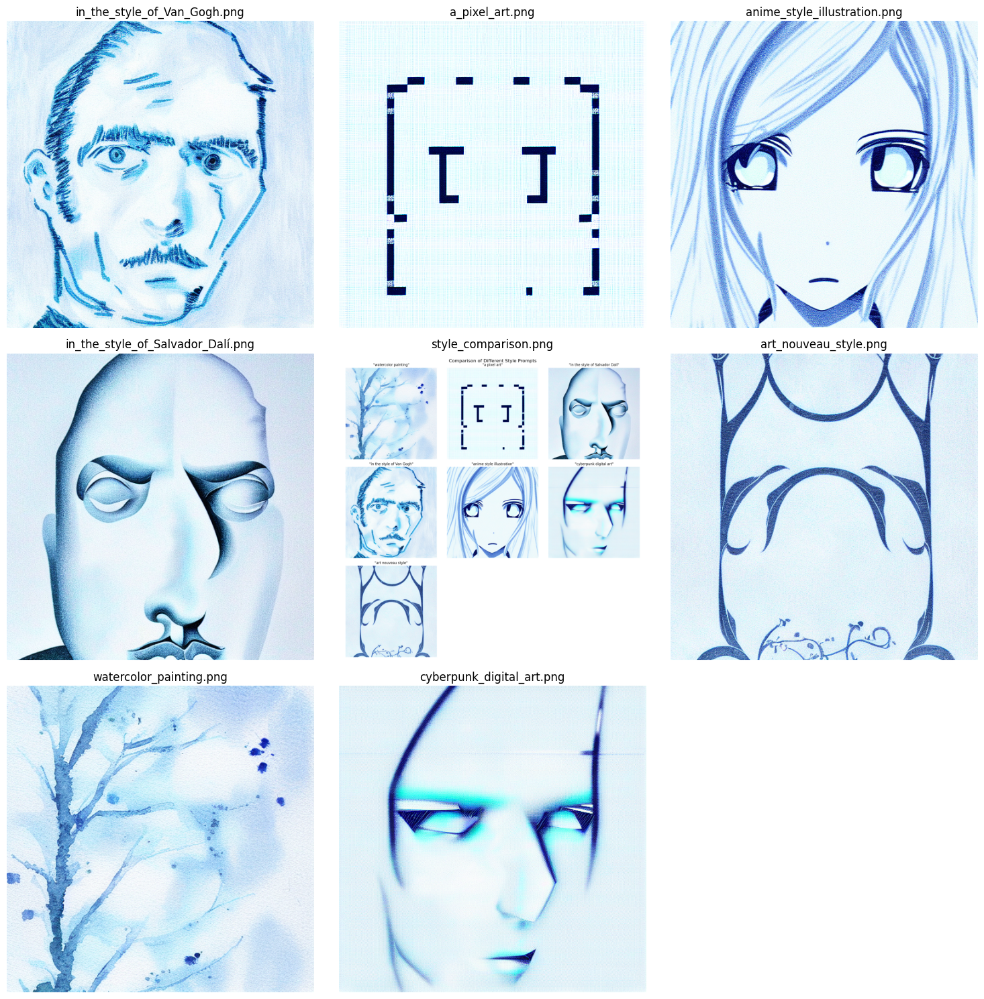

In [36]:
import matplotlib.pyplot as plt
import os

output_dir = "stable_diffusion_outputs"

def display_images_in_directory(directory):
    """Displays all images in a given directory."""
    image_files = [f for f in os.listdir(directory) if f.endswith(('.png'))]

    if not image_files:
        print(f"No images found in directory: {directory}")
        return

    num_images = len(image_files)
    cols = min(num_images, 3)
    rows = (num_images + cols - 1) // cols

    plt.figure(figsize=(15, 5 * rows))

    for i, image_file in enumerate(image_files):
      image_path = os.path.join(directory, image_file)
      try:
          img = plt.imread(image_path)
          plt.subplot(rows, cols, i+1)
          plt.imshow(img)
          plt.title(image_file)
          plt.axis('off')
      except Exception as e:
          print(f"Error loading or displaying image {image_file}: {e}")

    plt.tight_layout()
    plt.show()
# Display images from the prompt variations subdirectory
prompt_variations_dir = os.path.join(output_dir, "prompt_variations")
if os.path.exists(prompt_variations_dir):
    print("\nPrompt Variation Images:")
    display_images_in_directory(prompt_variations_dir)
